In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mofax as mfx
#import os 
#os.chdir("../")

In [2]:
from matplotlib import rcParams
rcParams["figure.dpi"] = 200

In [3]:
import os

scenario_files = {}
model_paths = {
    #'scenarioA': "models/scenario_A_mofa_model.hdf5",
    'scenarioE': "models/scenario_E_mofa_model.hdf5",
    'scenarioF': "models/scenario_F_mofa_model.hdf5",
    'scenarioG': "models/scenario_G_mofa_model.hdf5",
    'scenarioH': "models/scenario_H_mofa_model.hdf5",
    'scenarioI': "models/scenario_I_mofa_model.hdf5",
    'scenarioJ': "models/scenario_J_mofa_model.hdf5",
}

for scenario, path in model_paths.items():
    if os.path.exists(path):
        scenario_files[scenario] = mfx.mofa_model(path)
    else:
        print(f"Warning: File not found for {scenario}: {path}")

In [4]:
#mean values of each sum_abs for each scenario top 100 features
mean_values = {}
for scenario, model in scenario_files.items():
    df = model.get_weights(df=True)
    df['sum_abs'] = df.apply(lambda row: np.sum(np.abs(row)), axis=1)
    df = df.sort_values(by='sum_abs', ascending=False)
    mean_values[scenario] = df['sum_abs'][:100].mean()
mean_values

{}

In [5]:
#use for loop to get absolute values of weights for each scenario   

for scenario, m in scenario_files.items():
    sum_abs= []
    weights_df = m.get_weights(df=True)
    for i in range(len(weights_df)):
        sum_abs.append(np.sum(np.abs(weights_df.iloc[i])))
    df = pd.DataFrame(weights_df)
    df['sum_abs'] = sum_abs
    df = df.sort_values(by='sum_abs', ascending= False)
    scenario_files[scenario] = df.iloc[:100]

In [6]:
#plot the top 100 features for each scenario
plt.figure(figsize=(30, 30), dpi=500, clear=True, frameon= True)
num_scenarios = len(scenario_files)
rows = (num_scenarios + 1) // 2  # calculate the number of rows needed
for i, (scenario, df) in enumerate(scenario_files.items()):
    plt.subplot(rows, 2, i+1)
    sns.barplot(x=df['sum_abs'], y=df.index)
    plt.title(f'{scenario}: Top 50 features')
    plt.xlabel('Sum of absolute values')
    plt.ylabel('Feature')
plt.tight_layout()

<Figure size 15000x15000 with 0 Axes>

In [8]:
# in scenario E, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
if 'scenarioE' in scenario_files and 'scenarioE' in mean_values:
	scenarioE_binary = scenario_files['scenarioE']
	scenarioE_binary['binary'] = scenarioE_binary['sum_abs'].apply(lambda x: 1 if x > mean_values['scenarioE'] else 0)
	scenarioE_binary.head()
else:
	print("scenarioE not found in scenario_files or mean_values. Please check that the model file exists and previous cells have been run.")

scenarioE not found in scenario_files or mean_values. Please check that the model file exists and previous cells have been run.


In [ ]:
#min_max normalization on sum_abs weights for scenario E
scenarioE_min_max = scenario_files['scenarioE']
scenarioE_min_max['min_max'] = (scenarioE_min_max['sum_abs'] - scenarioE_min_max['sum_abs'].min()) / (scenarioE_min_max['sum_abs'].max() - scenarioE_min_max['sum_abs'].min())
scenarioE_min_max.head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,sum_abs,binary,min_max
Vsig4__ENSMUSG00000044206.3,0.682466,-1.660590,1.678105,0.959370,0.005018,-1.377686,0.087855,-0.693846,-3.683206,10.828142,1,1.000000
Adap2__ENSMUSG00000020709.15,0.913975,4.259499,-0.057584,1.626475,0.002932,2.185191,0.194721,0.000800,-1.196853,10.438030,1,0.905009
Cd164__ENSMUSG00000019818.15,0.430089,-3.431656,-0.637832,2.303507,0.000166,-1.571807,-0.097852,-0.031411,-1.900737,10.405058,1,0.896980
Adap2os__ENSMUSG00000086507.1,0.910580,3.800655,-0.007939,1.681315,0.003496,2.710332,0.292767,0.016071,-0.642021,10.065176,1,0.814219
Hpgd__ENSMUSG00000031613.9,0.494240,-2.930876,-0.005509,1.353949,-0.007370,-1.004908,-0.408545,-0.364054,-2.629350,9.198801,1,0.603259


In [ ]:
#in scenario F, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
scenarioF_binary = scenario_files['scenarioF']
scenarioF_binary ['binary'] = scenarioF_binary ['sum_abs'].apply(lambda x: 1 if x > mean_values['scenarioF'] else 0)
scenarioF_binary .head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,Factor10,Factor11,Factor12,Factor13,sum_abs,binary
Adap2os__ENSMUSG00000086507.1,8.590116e-01,0.000008,-0.436361,2.567983,0.085740,0.572733,0.000463,-0.000175,-0.597835,-2.917191,-2.493511,-0.156290,-0.000643,10.687944,1
Rpl35__ENSMUSG00000062997.6,9.505718e-01,-0.007635,1.111602,-1.290126,2.537542,-1.134698,0.054220,-0.021749,0.547115,-1.590554,0.439014,0.798540,0.202574,10.685941,1
Adap2__ENSMUSG00000020709.15,8.719358e-01,-0.004868,-0.132870,2.366636,-0.004632,0.434265,0.032099,-0.013289,-0.959866,-3.006618,-2.080042,-0.240181,0.116651,10.263952,1
Cyp2d10,-7.669117e-11,-0.001612,-0.206262,-0.001127,-4.701839,-0.002365,-1.670994,1.698960,-0.000924,-0.000979,-0.001312,-0.000195,-1.793447,10.080016,1
Pabpc1__ENSMUSG00000022283.15,1.079749e+00,0.000527,-0.978891,-0.242809,1.072136,-1.101450,-0.003623,0.001612,-0.012633,-3.681439,0.152820,-1.739050,-0.001678,10.068417,1


In [ ]:
#min_max normalization on sum_abs weights for scenario F
scenarioF_min_max = scenario_files['scenarioF']
scenarioF_min_max['min_max'] = (scenarioF_min_max['sum_abs'] - scenarioF_min_max['sum_abs'].min()) / (scenarioF_min_max['sum_abs'].max() - scenarioF_min_max['sum_abs'].min())
scenarioF_min_max

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,Factor10,Factor11,Factor12,Factor13,sum_abs,binary,min_max
Adap2os__ENSMUSG00000086507.1,8.590116e-01,0.000008,-0.436361,2.567983,0.085740,0.572733,0.000463,-0.000175,-0.597835,-2.917191,-2.493511,-0.156290,-0.000643,10.687944,1,1.000000
Rpl35__ENSMUSG00000062997.6,9.505718e-01,-0.007635,1.111602,-1.290126,2.537542,-1.134698,0.054220,-0.021749,0.547115,-1.590554,0.439014,0.798540,0.202574,10.685941,1,0.999455
Adap2__ENSMUSG00000020709.15,8.719358e-01,-0.004868,-0.132870,2.366636,-0.004632,0.434265,0.032099,-0.013289,-0.959866,-3.006618,-2.080042,-0.240181,0.116651,10.263952,1,0.884601
Cyp2d10,-7.669117e-11,-0.001612,-0.206262,-0.001127,-4.701839,-0.002365,-1.670994,1.698960,-0.000924,-0.000979,-0.001312,-0.000195,-1.793447,10.080016,1,0.834538
Pabpc1__ENSMUSG00000022283.15,1.079749e+00,0.000527,-0.978891,-0.242809,1.072136,-1.101450,-0.003623,0.001612,-0.012633,-3.681439,0.152820,-1.739050,-0.001678,10.068417,1,0.831381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sat1__ENSMUSG00000025283.15,1.104829e+00,-0.000118,0.059013,2.164400,0.178504,-1.284780,0.002333,-0.000633,-1.487576,-0.338821,-0.024894,0.403136,0.013549,7.062588,0,0.013274
Fcgr4__ENSMUSG00000059089.4,8.634055e-01,0.004270,0.002611,-0.068139,-1.198420,-1.040530,-0.024720,0.010938,-1.704225,1.115068,0.928861,0.018915,-0.081214,7.061316,0,0.012928
Ctsb__ENSMUSG00000021939.8,9.130920e-01,-0.005714,-0.052519,0.910254,-0.060576,-1.292930,0.038234,-0.015647,-1.274622,-0.993794,-0.128437,1.224421,0.141142,7.051381,0,0.010224
Cd81__ENSMUSG00000037706.17,1.009881e+00,-0.006474,-0.051612,-0.039815,0.162583,-1.253656,0.039727,-0.016714,-2.439133,-1.716293,-0.075572,0.080216,0.122164,7.013840,0,0.000006


In [ ]:
#in scenario G, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
scenarioG_binary = scenario_files['scenarioG']
scenarioG_binary ['binary'] = scenarioG_binary ['sum_abs'].apply(lambda x: 1 if x > mean_values['scenarioG'] else 0)
scenarioG_binary .head()

,Factor1,Factor2,Factor3,Factor4,sum_abs,binary
Cnnm4__ENSMUSG00000037408.10,-2.822016,0.299058,3.565260,1.286865,7.973199,1
TAG(58:8)_TAG,-1.970505,0.049263,-4.462343,-1.291611,7.773721,1
TAG(56:7)_TAG,-2.151956,-0.049476,-4.820329,-0.491593,7.513355,1
TAG(56:8)_TAG,-2.193355,-0.058987,-4.343812,-0.787629,7.383783,1
Adap2os__ENSMUSG00000086507.1,-2.251745,0.878820,3.540172,0.541467,7.212204,1


In [ ]:
#min_max normalization on sum_abs weights for scenario G
scenarioG_min_max = scenario_files['scenarioG']
scenarioG_min_max['min_max'] = (scenarioG_min_max['sum_abs'] - scenarioG_min_max['sum_abs'].min()) / (scenarioG_min_max['sum_abs'].max() - scenarioG_min_max['sum_abs'].min())
scenarioG_min_max

,Factor1,Factor2,Factor3,Factor4,sum_abs,binary,min_max
Cnnm4__ENSMUSG00000037408.10,-2.822016,0.299058,3.565260,1.286865,7.973199,1,1.000000
TAG(58:8)_TAG,-1.970505,0.049263,-4.462343,-1.291611,7.773721,1,0.932742
TAG(56:7)_TAG,-2.151956,-0.049476,-4.820329,-0.491593,7.513355,1,0.844955
TAG(56:8)_TAG,-2.193355,-0.058987,-4.343812,-0.787629,7.383783,1,0.801268
Adap2os__ENSMUSG00000086507.1,-2.251745,0.878820,3.540172,0.541467,7.212204,1,0.743417
...,...,...,...,...,...,...,...
Pirb__ENSMUSG00000058818.13,-1.950095,1.005031,1.262277,-0.819917,5.037319,0,0.010118
TAG(50:3)_TAG,-0.733305,0.662879,-3.029570,0.607844,5.033598,0,0.008863
Fam103a1__ENSMUSG00000038646.13,-1.587113,0.296603,-2.620917,0.506892,5.011525,0,0.001421
Smpdl3a__ENSMUSG00000019872.13,-1.541594,0.741188,-1.988786,-0.736785,5.008353,0,0.000351


In [ ]:
#in scenario H, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
scenarioH_binary = scenario_files['scenarioH']
scenarioH_binary ['binary'] = scenarioH_binary ['sum_abs'].apply(lambda x: 1 if x > mean_values['scenarioH'] else 0)
scenarioH_binary .head()

,Factor1,sum_abs,binary
TAG(56:7)_TAG,-4.540865,4.540865,1
TAG(56:8)_TAG,-4.347708,4.347708,1
Cd14__ENSMUSG00000051439.6,-4.288870,4.288870,1
Psme2b__ENSMUSG00000078153.3,-4.103007,4.103007,1
TAG(58:8)_TAG,-4.048636,4.048636,1


In [ ]:
#min_max normalization on sum_abs weights for scenario H
scenarioH_min_max = scenario_files['scenarioH']
scenarioH_min_max['min_max'] = (scenarioH_min_max['sum_abs'] - scenarioH_min_max['sum_abs'].min()) / (scenarioH_min_max['sum_abs'].max() - scenarioH_min_max['sum_abs'].min())
scenarioH_min_max


,Factor1,sum_abs,binary,min_max
TAG(56:7)_TAG,-4.540865,4.540865,1,1.000000
TAG(56:8)_TAG,-4.347708,4.347708,1,0.832200
Cd14__ENSMUSG00000051439.6,-4.288870,4.288870,1,0.781086
Psme2b__ENSMUSG00000078153.3,-4.103007,4.103007,1,0.619622
TAG(58:8)_TAG,-4.048636,4.048636,1,0.572388
...,...,...,...,...
Slamf9__ENSMUSG00000026548.4,-3.399648,3.399648,0,0.008597
Slc25a5__ENSMUSG00000016319.3,-3.399622,3.399622,0,0.008574
Selplg__ENSMUSG00000048163.13,-3.398292,3.398292,0,0.007418
Lsm7__ENSMUSG00000035215.9,-3.393023,3.393023,0,0.002842


In [ ]:
#in scenario I, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
scenarioI_binary = scenario_files['scenarioI']
scenarioI_binary ['binary'] = scenarioI_binary ['sum_abs'].apply(lambda x: 1 if x > mean_values['scenarioI'] else 0)
scenarioI_binary .head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,Factor10,Factor11,Factor12,Factor13,Factor14,Factor15,Factor16,Factor17,Factor18,sum_abs,binary
Cd164__ENSMUSG00000019818.15,0.446792,-0.002453,0.104107,0.025887,-0.000060,-2.006295,-0.000228,0.001581,2.027094,-0.383862,1.324022,-1.955020,-0.209473,0.884911,2.042355,-0.020765,1.960124,-0.001149,13.396179,1
Adap2os__ENSMUSG00000086507.1,0.949090,0.002940,-0.212056,-0.035412,0.000037,-1.083135,0.000028,-0.002483,-2.762355,0.035511,-0.069014,-2.991102,0.285374,-0.017421,-1.947897,0.028666,-2.500735,0.000830,12.924087,1
Adap2__ENSMUSG00000020709.15,0.940223,-0.000997,0.064396,0.011887,-0.000004,-1.325182,0.000048,0.000987,-2.275933,0.014639,-0.035172,-2.676177,0.181439,-0.112040,-2.258044,-0.010481,-2.179033,-0.000093,12.086774,1
Rpl35__ENSMUSG00000062997.6,0.943859,0.000638,-0.022882,-0.010422,-0.000008,0.754737,-0.000101,-0.000829,0.511718,-1.033105,-2.443357,1.293894,1.329243,-1.421647,-0.036603,0.007883,-1.418540,-0.000826,11.230290,1
Hpgd__ENSMUSG00000031613.9,0.485134,-0.005609,0.331477,0.059219,-0.000105,-2.615979,-0.000317,0.004044,1.509228,-0.507250,0.121708,-0.937273,-1.207333,0.117328,1.815005,-0.049252,1.420288,-0.001156,11.187704,1


In [ ]:
#min_max normalization on sum_abs weights for scenario I
scenarioI_min_max = scenario_files['scenarioI']
scenarioI_min_max['min_max'] = (scenarioI_min_max['sum_abs'] - scenarioI_min_max['sum_abs'].min()) / (scenarioI_min_max['sum_abs'].max() - scenarioI_min_max['sum_abs'].min())
scenarioI_min_max.head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,Factor10,...,Factor12,Factor13,Factor14,Factor15,Factor16,Factor17,Factor18,sum_abs,binary,min_max
Cd164__ENSMUSG00000019818.15,0.446792,-0.002453,0.104107,0.025887,-0.000060,-2.006295,-0.000228,0.001581,2.027094,-0.383862,...,-1.955020,-0.209473,0.884911,2.042355,-0.020765,1.960124,-0.001149,13.396179,1,1.000000
Adap2os__ENSMUSG00000086507.1,0.949090,0.002940,-0.212056,-0.035412,0.000037,-1.083135,0.000028,-0.002483,-2.762355,0.035511,...,-2.991102,0.285374,-0.017421,-1.947897,0.028666,-2.500735,0.000830,12.924087,1,0.920970
Adap2__ENSMUSG00000020709.15,0.940223,-0.000997,0.064396,0.011887,-0.000004,-1.325182,0.000048,0.000987,-2.275933,0.014639,...,-2.676177,0.181439,-0.112040,-2.258044,-0.010481,-2.179033,-0.000093,12.086774,1,0.780801
Rpl35__ENSMUSG00000062997.6,0.943859,0.000638,-0.022882,-0.010422,-0.000008,0.754737,-0.000101,-0.000829,0.511718,-1.033105,...,1.293894,1.329243,-1.421647,-0.036603,0.007883,-1.418540,-0.000826,11.230290,1,0.637422
Hpgd__ENSMUSG00000031613.9,0.485134,-0.005609,0.331477,0.059219,-0.000105,-2.615979,-0.000317,0.004044,1.509228,-0.507250,...,-0.937273,-1.207333,0.117328,1.815005,-0.049252,1.420288,-0.001156,11.187704,1,0.630293


In [ ]:
#in scenario J, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
scenarioJ_binary = scenario_files['scenarioJ']
scenarioJ_binary ['binary'] = scenarioJ_binary ['sum_abs'].apply(lambda x: 1 if x > mean_values['scenarioJ'] else 0)
scenarioJ_binary .head()


,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,Factor10,...,Factor16,Factor17,Factor18,Factor19,Factor20,Factor21,Factor22,Factor23,sum_abs,binary
Adap2__ENSMUSG00000020709.15,0.917262,0.001989,0.002700,0.003282,0.000175,0.001146,1.862845,-1.145951,0.010764,0.005981,...,0.003488,-1.645013,0.001269,-1.021856,-0.002673,0.000741,-0.007441,0.461073,11.840186,1
Pabpc1__ENSMUSG00000022283.15,1.043074,-0.011408,0.020171,-0.025805,-0.000930,-0.006089,-0.940174,-0.017235,-1.057021,-0.035764,...,-0.015929,-2.444565,-0.009498,-1.251320,0.017974,-0.009424,0.061389,1.541685,11.359980,1
Adap2os__ENSMUSG00000086507.1,0.923025,0.003483,-0.053818,0.008757,0.000174,0.001145,1.994173,-0.699800,0.032524,0.004580,...,-0.002902,-1.331547,0.002961,-0.305747,-0.004017,0.005055,-0.023020,0.656796,11.116611,1
Cd164__ENSMUSG00000019818.15,0.452328,-0.004876,0.044579,-0.010260,-0.000310,-0.002031,2.357077,-2.073117,-0.387749,-0.009029,...,-0.000490,0.196991,-0.003750,0.723003,0.005524,-0.005052,0.026816,-0.216411,11.087418,1
Hpgd__ENSMUSG00000031613.9,0.491056,-0.001513,0.091578,-0.005067,0.000097,0.000623,1.343107,-2.748945,-0.491895,0.008287,...,0.013800,1.134514,-0.001380,0.607892,0.000120,-0.009152,0.019977,-0.758733,10.843267,1


In [ ]:
#min_max normalization on sum_abs weights for scenario J
scenarioJ_min_max = scenario_files['scenarioJ']
scenarioJ_min_max['min_max'] = (scenarioJ_min_max['sum_abs'] - scenarioJ_min_max['sum_abs'].min()) / (scenarioJ_min_max['sum_abs'].max() - scenarioJ_min_max['sum_abs'].min())
scenarioJ_min_max.head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,Factor10,...,Factor17,Factor18,Factor19,Factor20,Factor21,Factor22,Factor23,sum_abs,binary,min_max
Adap2__ENSMUSG00000020709.15,0.917262,0.001989,0.002700,0.003282,0.000175,0.001146,1.862845,-1.145951,0.010764,0.005981,...,-1.645013,0.001269,-1.021856,-0.002673,0.000741,-0.007441,0.461073,11.840186,1,1.000000
Pabpc1__ENSMUSG00000022283.15,1.043074,-0.011408,0.020171,-0.025805,-0.000930,-0.006089,-0.940174,-0.017235,-1.057021,-0.035764,...,-2.444565,-0.009498,-1.251320,0.017974,-0.009424,0.061389,1.541685,11.359980,1,0.898136
Adap2os__ENSMUSG00000086507.1,0.923025,0.003483,-0.053818,0.008757,0.000174,0.001145,1.994173,-0.699800,0.032524,0.004580,...,-1.331547,0.002961,-0.305747,-0.004017,0.005055,-0.023020,0.656796,11.116611,1,0.846511
Cd164__ENSMUSG00000019818.15,0.452328,-0.004876,0.044579,-0.010260,-0.000310,-0.002031,2.357077,-2.073117,-0.387749,-0.009029,...,0.196991,-0.003750,0.723003,0.005524,-0.005052,0.026816,-0.216411,11.087418,1,0.840318
Hpgd__ENSMUSG00000031613.9,0.491056,-0.001513,0.091578,-0.005067,0.000097,0.000623,1.343107,-2.748945,-0.491895,0.008287,...,1.134514,-0.001380,0.607892,0.000120,-0.009152,0.019977,-0.758733,10.843267,1,0.788527


In [10]:
#upsetplot to show the overlapping and non overlapping of genes or features between each scenario
#set size is = 100
import upsetplot
from upsetplot import generate_counts
from upsetplot import UpSet
from upsetplot import plot
from upsetplot import from_contents

required_scenarios = ['scenarioE', 'scenarioF', 'scenarioG', 'scenarioI', 'scenarioJ']
missing = [s for s in required_scenarios if s not in scenario_files or scenario_files[s] is None]
if scenario_files == {} or missing:
	print(f"Error: scenario_files is empty or missing scenarios: {missing}. Please ensure previous cells have run and model files exist.")
else:
	data = from_contents({
		'scenarioE': scenario_files['scenarioE'].index,
		'scenarioF': scenario_files['scenarioF'].index,
		'scenarioG': scenario_files['scenarioG'].index,
		'scenarioI': scenario_files['scenarioI'].index, 
		'scenarioJ': scenario_files['scenarioJ'].index
	})
	upset = UpSet(data, orientation='horizontal', element_size=100)
	upset.plot()
	plt.show()

Error: scenario_files is empty or missing scenarios: ['scenarioE', 'scenarioF', 'scenarioG', 'scenarioI', 'scenarioJ']. Please ensure previous cells have run and model files exist.


In [ ]:
#list of common features in all scenarios
common_features = []
for feature in scenario_files['scenarioE'].index:
    if feature in scenario_files['scenarioF'].index:
        if feature in scenario_files['scenarioG'].index:
            #if feature in scenario_files['scenarioH'].index:
                if feature in scenario_files['scenarioI'].index:
                    if feature in scenario_files['scenarioJ'].index:
                        common_features.append(feature)
len(common_features)


9

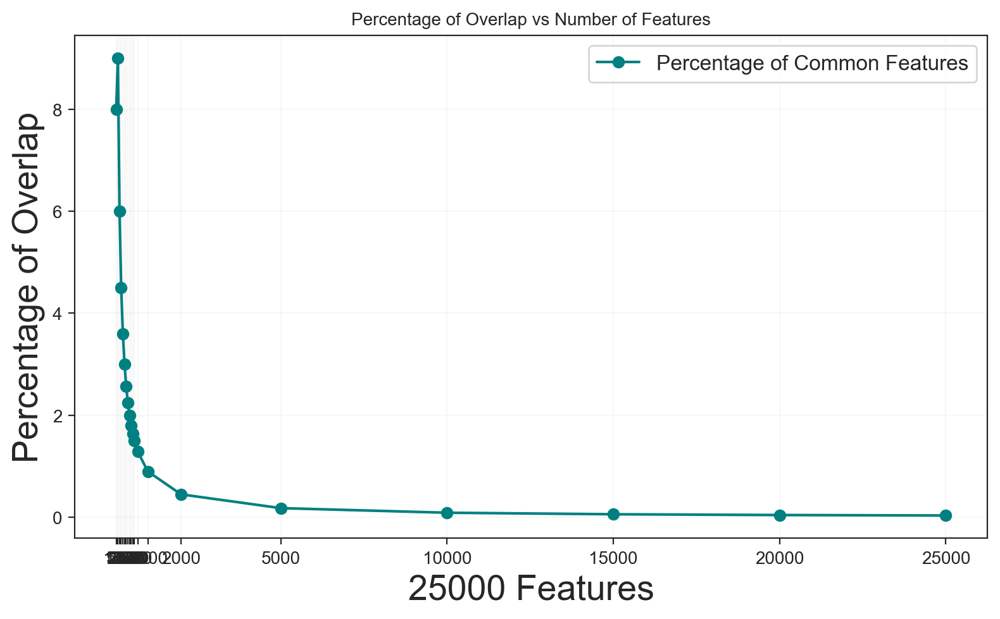

In [ ]:

# Number of features selected
features_num = [50, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 700, 1000, 2000, 5000, 10000, 15000, 20000, 25000]

# Calculate overlap percentages
overlap_percentages = []
for i in features_num:
	if i == 0:
		overlap_percentages.append(0)
		continue
	common_features = []
	for feature in scenario_files['scenarioE'].index[:i]:
		if feature in scenario_files['scenarioF'].index[:i]:
			if feature in scenario_files['scenarioG'].index[:i]:
				#if feature in scenario_files['scenarioH'].index[:i]:
					if feature in scenario_files['scenarioI'].index[:i]:
						if feature in scenario_files['scenarioJ'].index[:i]:
							common_features.append(feature)
	overlap_percentages.append(len(common_features) / i * 100)

# Plot the percentage of common features between scenarios
plt.figure(figsize=(8, 5))
plt.plot(features_num, overlap_percentages, marker='o', linestyle='-', color='teal', label='Percentage of Common Features')

# Plot settings
plt.title('Percentage of Overlap vs Number of Features', fontsize=10)
plt.xlabel('25000 Features', fontsize=20)
plt.ylabel('Percentage of Overlap', fontsize=20)
plt.grid(alpha=0.15)
plt.xticks(features_num)  # Set x-axis points
plt.legend(fontsize=12)
plt.tight_layout()

# Show plot
plt.show()

In [ ]:
import numpy as np
import pandas as pd

weights_scenario_E = scenarioE_min_max['min_max']
weights_scenario_F = scenarioF_min_max['min_max']
weights_scenario_G = scenarioG_min_max['min_max']
#weights_scenario_H = scenarioH_min_max['min_max']
weights_scenario_I = scenarioI_min_max['min_max']
weights_scenario_J = scenarioJ_min_max['min_max']


df = pd.DataFrame({
    'S_10_factor': weights_scenario_E,
    'S_15_factor': weights_scenario_F,
    'S_5_factor': weights_scenario_G,
    #"Scenario H": weights_scenario_H,
    "S_20_factor": weights_scenario_I,
    "S_50_factor": weights_scenario_J
})

correlation_matrix = df.corr()
print(correlation_matrix)


             S_10_factor  S_15_factor  S_5_factor  S_20_factor  S_50_factor
S_10_factor     1.000000     0.628222    0.466116     0.681892     0.709462
S_15_factor     0.628222     1.000000    0.772687     0.801176     0.690235
S_5_factor      0.466116     0.772687    1.000000     0.457466     0.589273
S_20_factor     0.681892     0.801176    0.457466     1.000000     0.784656
S_50_factor     0.709462     0.690235    0.589273     0.784656     1.000000


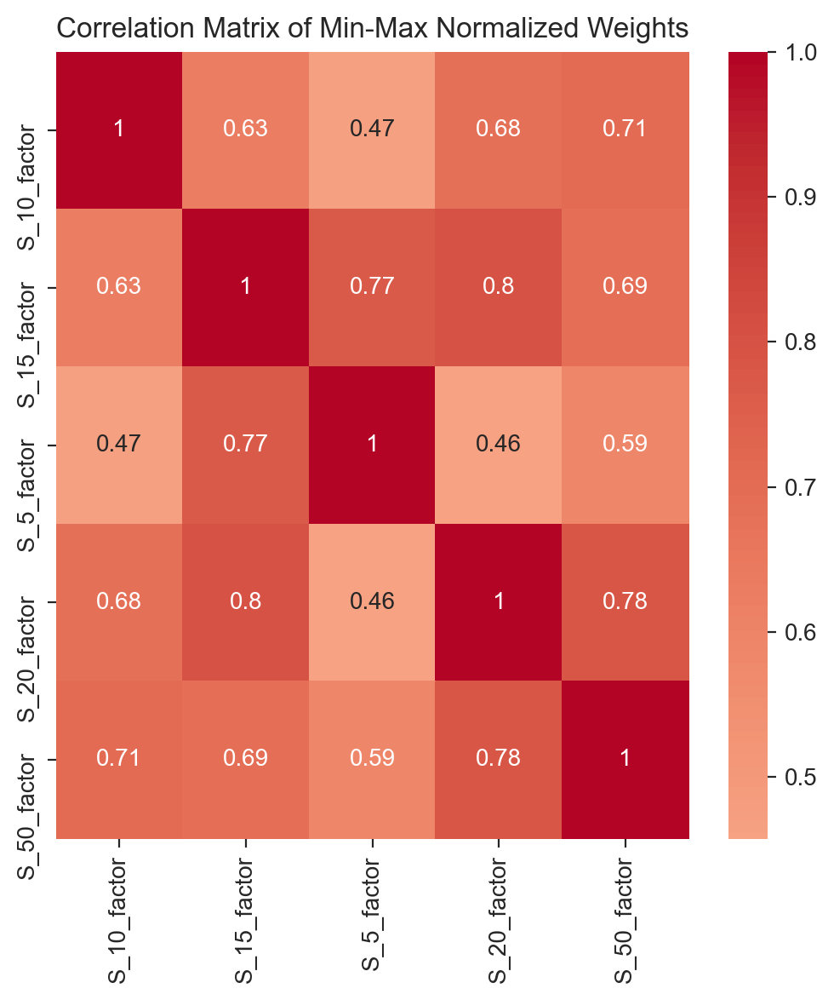

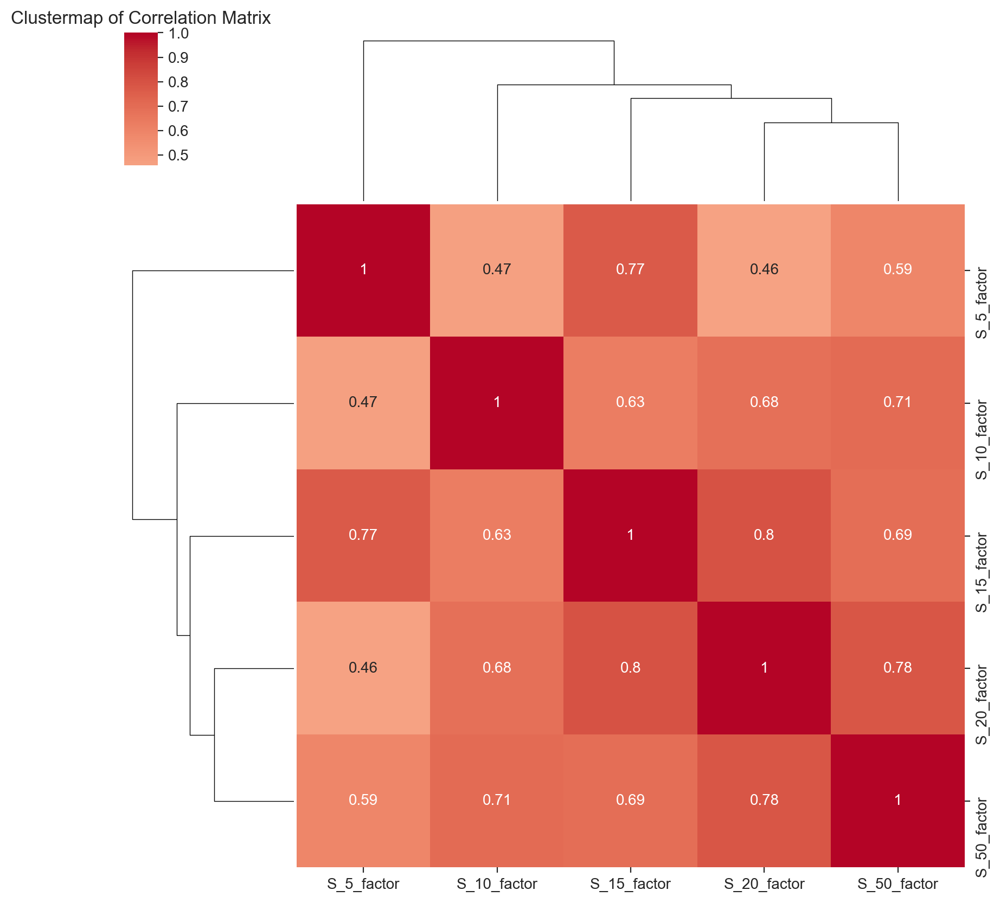

In [ ]:
#plot the correlation matrix
plt.figure(figsize=(6, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix of Min-Max Normalized Weights")
plt.show()

#add clustermap to the correlation matrix
#replace the scenario names with the factors names: S_5_factor, S_10_factor, S_15_factor, S_20_factor, S_50_factor
correlation_matrix.index = ['S_10_factor', 'S_15_factor', 'S_5_factor', 'S_20_factor', 'S_50_factor']
sns.clustermap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Clustermap of Correlation Matrix")
plt.show()


In [ ]:
#correlation for gene insread of scenario
weights_scenario_E = scenarioE_min_max['min_max']
#weights_scenario_F = scenarioF_min_max['min_max']
weights_scenario_G = scenarioG_min_max['min_max']
#weights_scenario_H = scenarioH_min_max['min_max']
#weights_scenario_I = scenarioI_min_max['min_max']
#weights_scenario_J = scenarioJ_min_max['min_max']

df = pd.DataFrame({
    'Scenario E': weights_scenario_E,
    #'Scenario F': weights_scenario_F,
    'Scenario G': weights_scenario_G,
    #"Scenario H": weights_scenario_H,
    #"Scenario I": weights_scenario_I,
    #"Scenario J": weights_scenario_J
})

correlation_matrix = df.corr()
print(correlation_matrix)


            Scenario E  Scenario G
Scenario E    1.000000    0.466116
Scenario G    0.466116    1.000000


In [ ]:
#plot based on min_max normalized weights
plt.figure(figsize=(30, 30), dpi=500, clear=True, frameon= True)
num_scenarios = len(scenario_files)
rows = (num_scenarios + 1) // 2  # calculate the number of rows needed
for i, (scenario, df) in enumerate(scenario_files.items()):
    plt.subplot(rows, 2, i+1)
    sns.barplot(x=df['min_max'][:100], y=df.index[:100])
    plt.title(f'{scenario}: Top 100 features')
    plt.xlabel('Min-Max Normalized Weights')
    plt.ylabel('Feature')
plt.tight_layout()

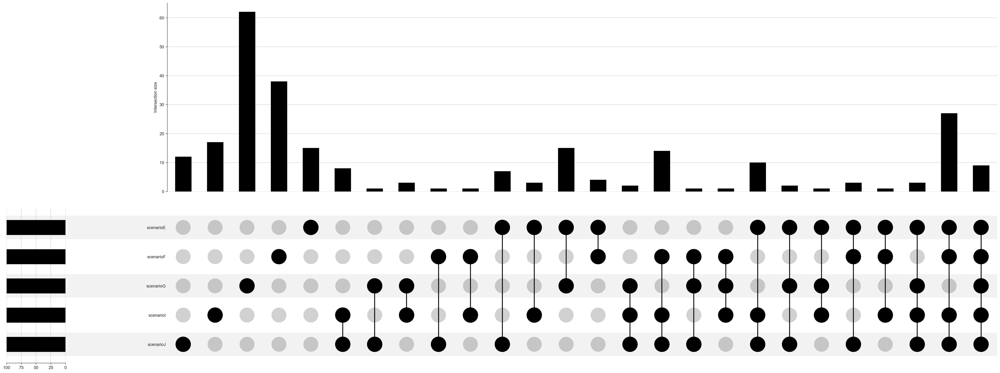

In [ ]:
#overlap of genes between all scenarios by upsetplot
data = from_contents({
	'scenarioE': scenario_files['scenarioE'].index,
	'scenarioF': scenario_files['scenarioF'].index,
	'scenarioG': scenario_files['scenarioG'].index,
	#'scenarioH': scenario_files['scenarioH'].index,
	'scenarioI': scenario_files['scenarioI'].index,
	'scenarioJ': scenario_files['scenarioJ'].index
})
data

upset = UpSet(data, orientation='horizontal', element_size=100)
upset.plot()
plt.show()




In [ ]:
#list of genes that are common in all scenarios
common_genes = set(scenario_files['scenarioE'].index) & set(scenario_files['scenarioF'].index) & set(scenario_files['scenarioG'].index) & set(scenario_files['scenarioI'].index) & set(scenario_files['scenarioJ'].index)
common_genes


{'Adap2__ENSMUSG00000020709.15',
 'Adap2os__ENSMUSG00000086507.1',
 'Cd164__ENSMUSG00000019818.15',
 'Ctsc__ENSMUSG00000030560.17',
 'Ilf3__ENSMUSG00000032178.14',
 'Lamp2__ENSMUSG00000016534.15',
 'Pirb__ENSMUSG00000058818.13',
 'Rab32__ENSMUSG00000019832.5',
 'Smpdl3a__ENSMUSG00000019872.13'}

In [ ]:
#list of common features in all scenarios
common_features = []
for feature in scenario_files['scenarioE'].index:
    if feature in scenario_files['scenarioF'].index:
        if feature in scenario_files['scenarioG'].index:
            if feature in scenario_files['scenarioI'].index:
                if feature in scenario_files['scenarioJ'].index:
                    common_features.append(feature)
len(common_features)


9